# SNAP-based Sentinel-2 Biophysical Parameter Time Series 

### _Import functional dependencies and add repository source directory to system path_

In [1]:
import os
import yaml
from munch import munchify

In [2]:
# define repo name and get root working directory
repo = 'process'
root_path = os.getcwd()[ 0 : os.getcwd().find( repo ) + len ( repo )]
root_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\apis\\process'

In [3]:
# get path to configuration files
cfg_path = os.path.join( root_path, 'cfg' )
cfg_path = os.path.join( cfg_path, 'sentinel-2' )
cfg_path

'C:\\Users\\crwil\\Documents\\GitHub\\sentinelhub\\apis\\process\\cfg\\sentinel-2'

### _Load configuration file from repository cfg sub-directory_ 

In [4]:
# get pathname to configuration file
cfg_file = os.path.join( cfg_path, 's2-timeseries-biophysical.yml' )

In [5]:
# print contents of configuration file
with open( cfg_file ) as f:
    print ( f.read() )

request:
    evalscript: |
                //VERSION=3
                function setup() {
                    return {
                        input: [{
                            bands: [
                                "B03",
                                "B04",
                                "B05",
                                "B06",
                                "B07",
                                "B8A",
                                "B11",
                                "B12",
                                "SCL",
                                "CLM",
                                "viewZenithMean",
                                "viewAzimuthMean",
                                "sunZenithAngles",
                                "sunAzimuthAngles",
                                "dataMask"
                            ]
                        }],
                        output: [{
                            id: "lai",
                            bands: 1,
   

In [6]:
# load cfg file using yaml parser
with open( cfg_file, 'r' ) as f:
    config = munchify( yaml.safe_load( f ) )

### _Define bounding box collocated with the Mendip Hills_

In [7]:
# define min and max latlons
coords = coords = -2.9,51.4,-2.4,51.1
resolution = 20

In [8]:
# create instance of shclient class
from processapi import Client
client = Client( config )

In [9]:
# get utm bbox
bbox = Client.getBoundingBox( coords )
print ( bbox, bbox.crs.value )

507001.8649223084,5660950.116983804,541738.5562872837,5694478.727371161 32630


In [10]:
# get aoi image dimensions
Client.getBoxDimensions( bbox, resolution )

(1737, 1676)

### _Search for S2 scenes with minimal cloud cover in May 2020_

In [11]:
# pick a few dates
from datetime import datetime
timeframe = { 'start' : datetime( 2020, 5, 2, 0, 0, 0 ), 
                'end' : datetime( 2020, 5, 4, 23, 59, 59 ) }

In [12]:
# get S2 acquisitions between start / end dates satisfying filter conditions
timestamps = client.getDatasetTimeStamps ( config.request.inputs[ 0 ], timeframe, bbox=bbox )
timestamps

[datetime.datetime(2020, 5, 4, 11, 26, 46, tzinfo=tzutc())]

### _Generate S2 Biophysical Time Series using Process API client_

In [13]:
# get time series
response = client.getTimeSeries ( timeframe, resolution, bbox=bbox )
response._df

,lai.tif,fapar.tif,cab.tif,fcover.tif,ccc.tif,qaMask.tif,time
0,"[[1.2602327, 1.3809853, 1.2189031, 1.0826861, ...","[[0.8770572, 0.8932104, 0.87170506, 0.84287035...","[[167.46199, 199.22351, 164.72356, 138.18115, ...","[[0.91884774, 0.9324129, 0.91117847, 0.8808297...","[[633.1232, 825.37427, 602.3461, 448.82043, 82...","[[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,...",2020-05-04 11:26:46+00:00


### _Visualise S2 True Color and False Color time series_

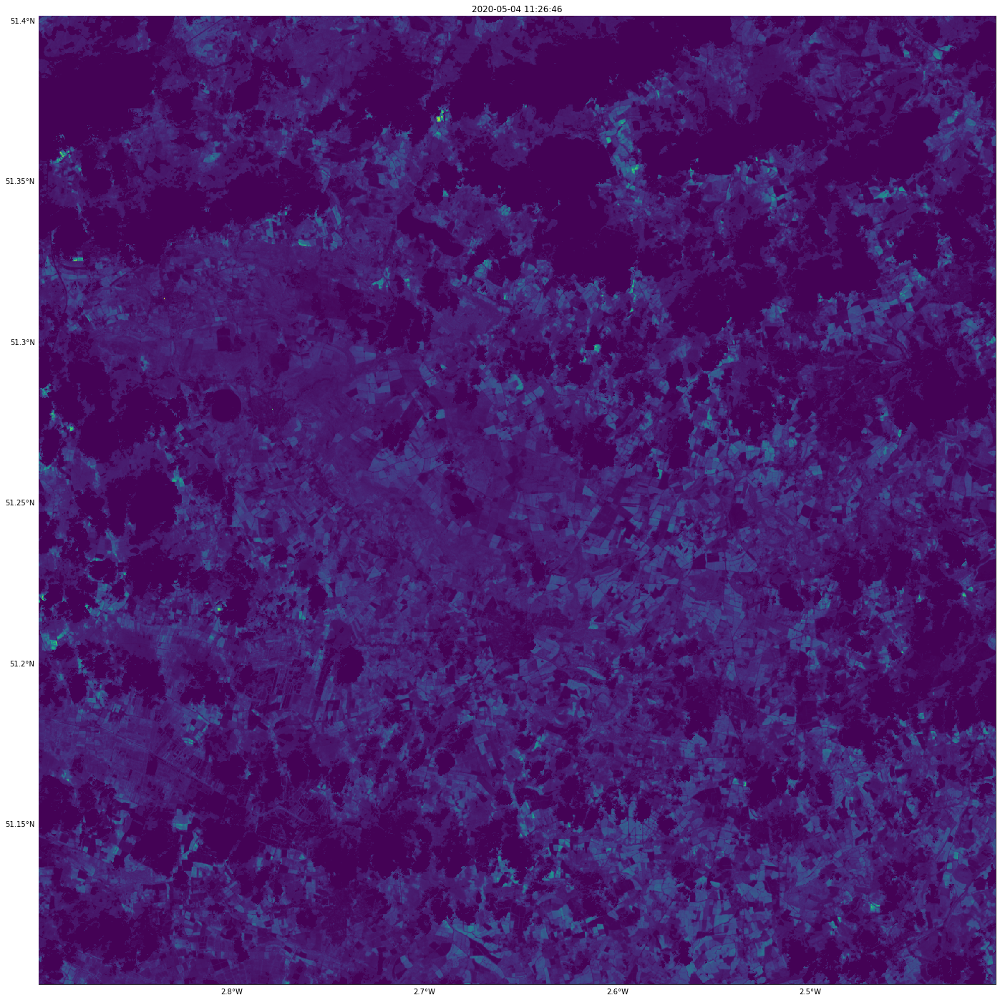

In [14]:
# plot time series
response.plotImages( 'lai.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )

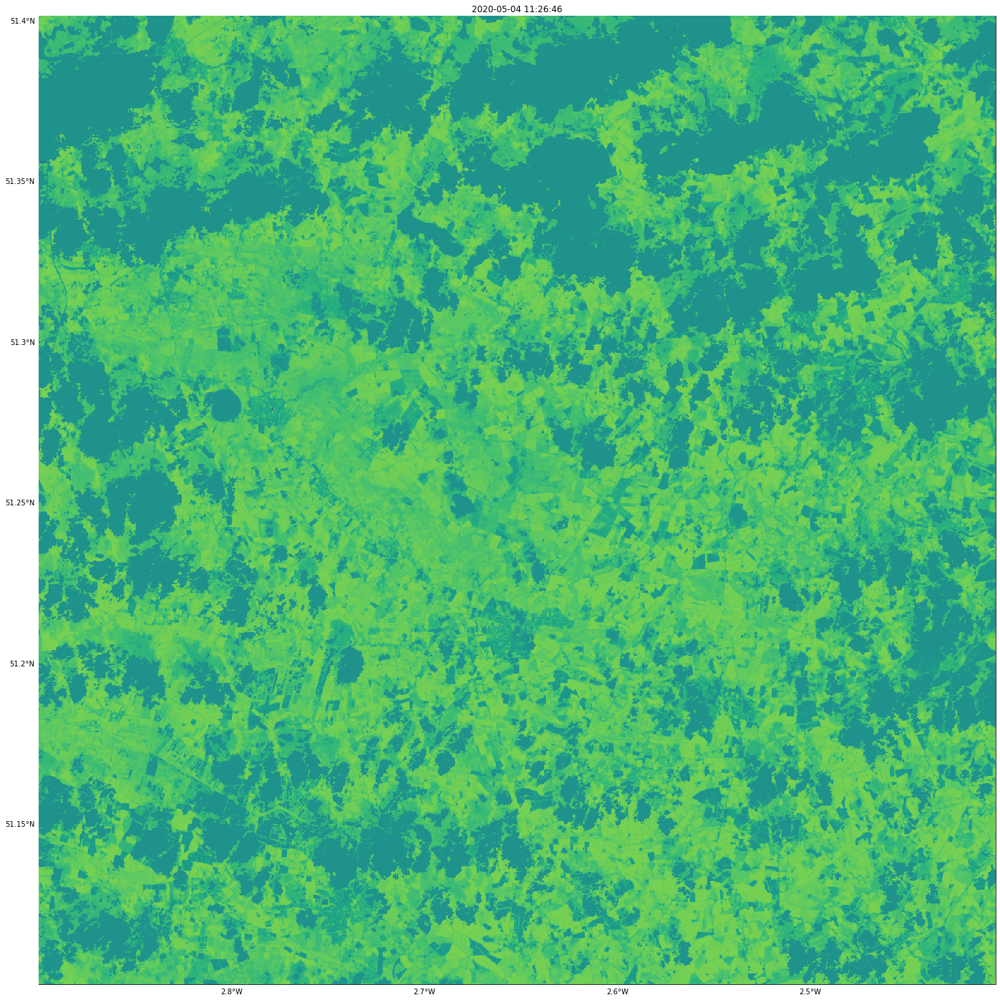

In [15]:
# plot time series
response.plotImages( 'fapar.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )

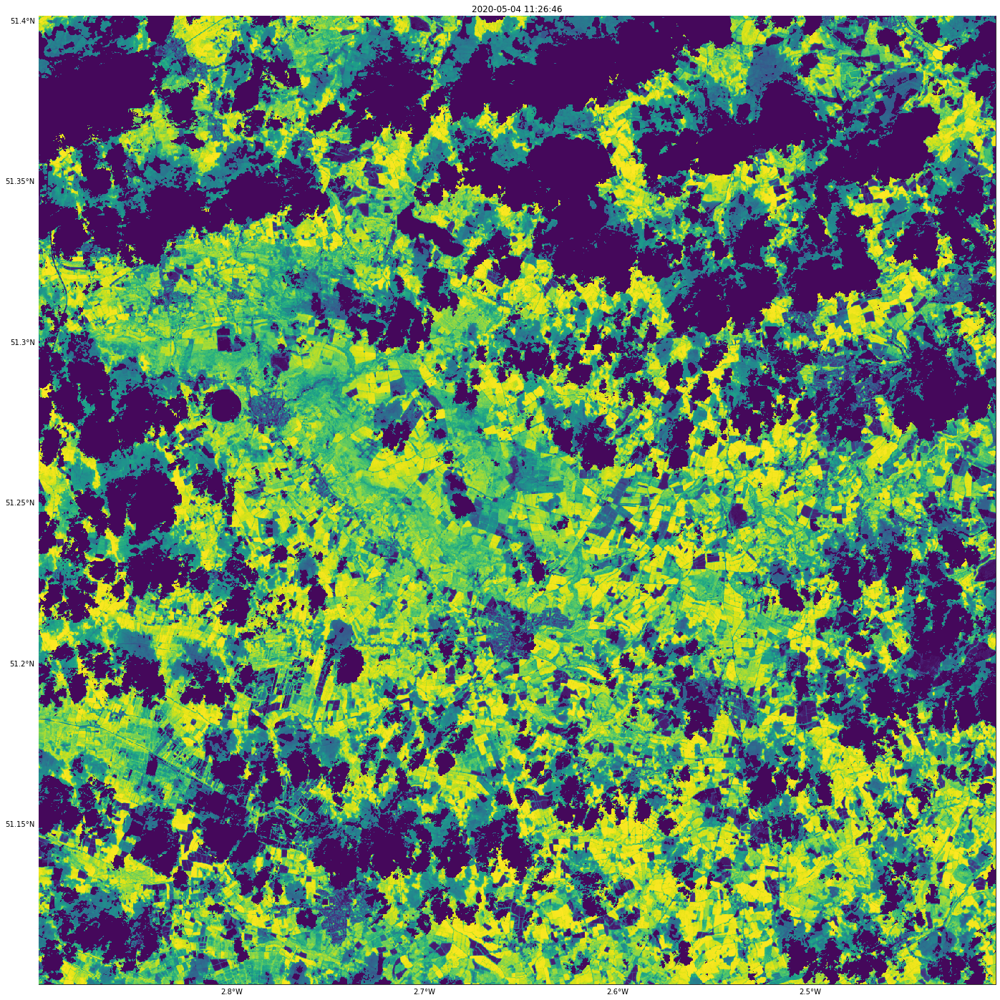

In [16]:
# plot time series
response.plotImages( 'fcover.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )

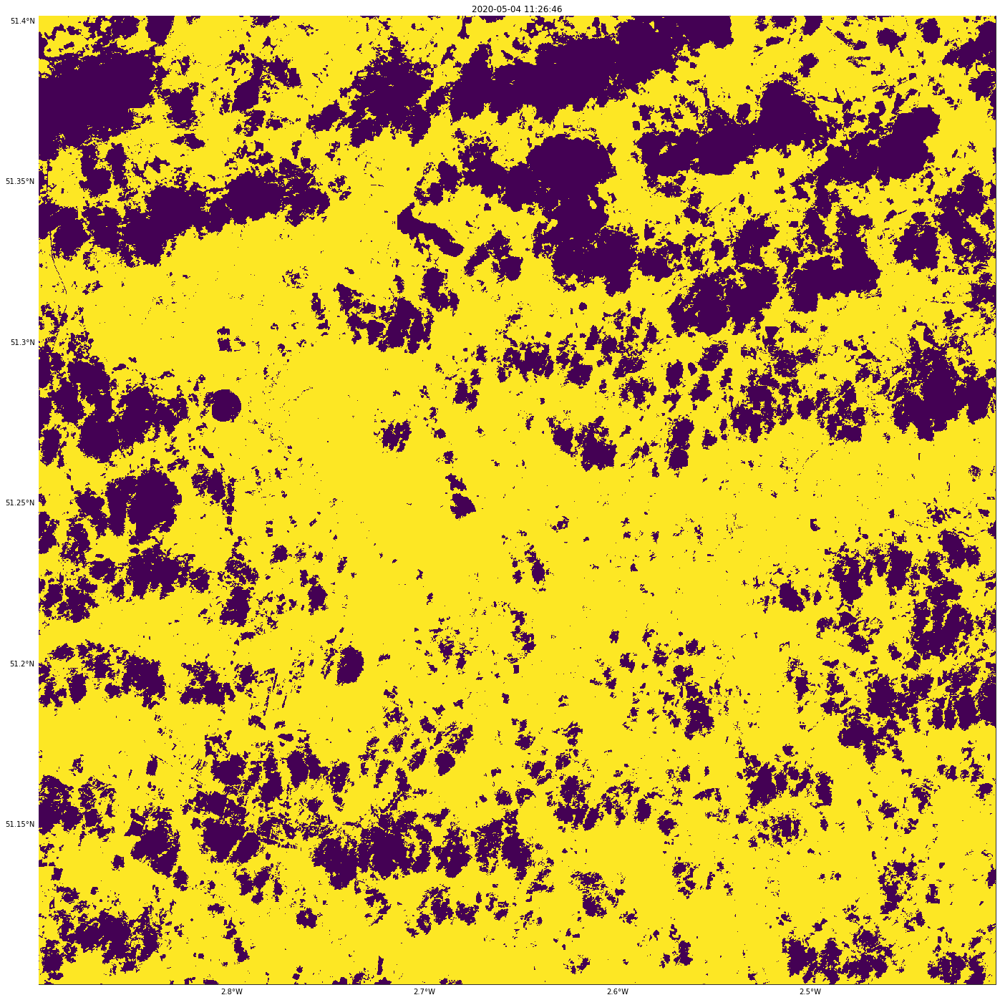

In [17]:
# plot time series
response.plotImages( 'qaMask.tif', alpha={ 'data' : 1.0, 'grid' : 0.0 } )